## End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data 

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them). 


In [ ]:
# Mount your drive and unzip the uploaded data
# !cd "/content/drive/My Drive/Dog Breed Kaggle/"
# from google.colab import drive
# drive.mount('/content/drive/My Drive/Dog Breed Kaggle/')
# !unzip "/content/drive/My Drive/Dog Breed Kaggle/dog-breed-identification.zip" -d "/content/drive/My Drive/Dog Breed Kaggle/"

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Get our workspace ready

* Import TensorFlow 
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import TensorFlow, TensorFlowHub into Colab
import tensorflow as tf
import tensorflow_hub as hub

# Check for GPU availability
print("GPU is Available" if  tf.config.list_physical_devices("GPU") else "GPU is not available")

GPU is Available


## Getting our data ready (Turning data into Tensors)

With all ML models, our data has to be in numerical format. So that's what we'll be doing first.   
Turning our images into Tensors (Numerical Expressions)

Let's start by accessing our data and checking out the labels.
 

In [ ]:
# Checkout the labels of our data

import pandas as pd
labels_csv = pd.read_csv("/content/drive/My Drive/Dog Breed Kaggle/labels.csv")


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,cb6e8b90c3769f074a74f27296cad88f,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


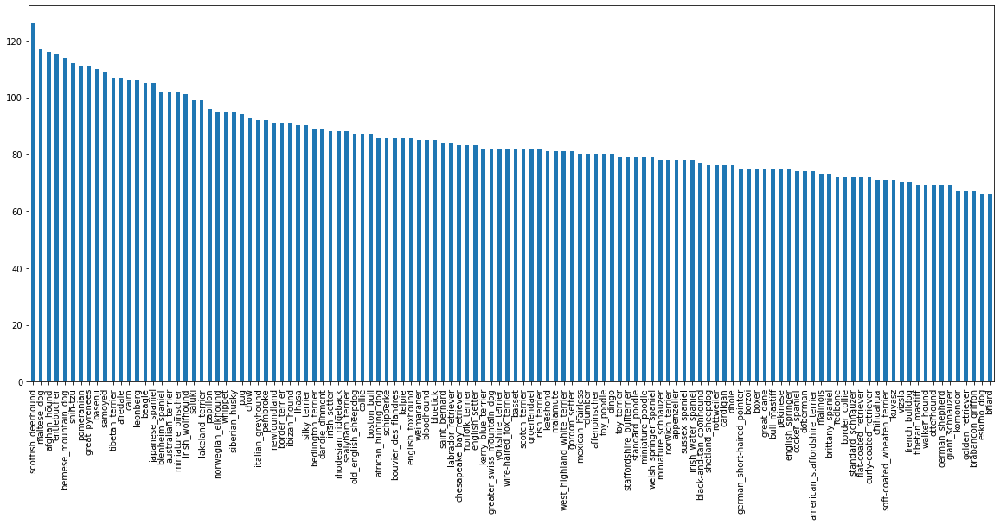

In [ ]:
# How many images are there of each bread
labels_csv["breed"].value_counts().plot(kind = "bar", figsize = (20, 8));

### Getting images and their label

Let's get a list of all our images file path names

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/My Drive/Dog Breed Kaggle/train/" + fname + ".jpg" for fname in labels_csv["id"]]


In [ ]:
#check the first name
filenames[:10]

['/content/drive/My Drive/Dog Breed Kaggle/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# check wheater number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/My Drive/Dog Breed Kaggle/train")) == len(filenames):
  print("Number of files Matchs")
else:
  print("Number of files do not Match") 

Number of files Matched


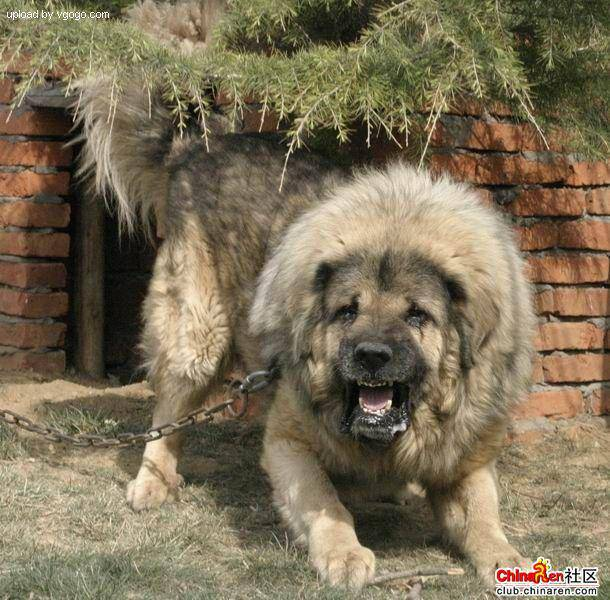

In [ ]:
# One more check
from IPython.display import Image
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000] #name of the breed in the image above

'tibetan_mastiff'

Since we'have now got out training imahe filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
#convert to label
labels = labels_csv["breed"].to_numpy() 
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# see if number of labels matches the number of filenames

if len(labels) == len(filenames):
  print("Label count match")
else:
  print("Labels count doesn't match")

Label count match


In [ ]:
# find the unique label values  
unique_breeds = np.unique(labels)
len(unique_breeds), unique_breeds[:10]

(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle'], dtype=object))

In [ ]:
# Turn a single label into an array of boolean
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels) 

10222

In [ ]:
# Example : Turning boolean array into integers
# this is nothing but onehotencoding
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # this prints index of max value where label occurs in boolean array
print(boolean_labels[0].astype(int)) # boolean into number

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10] #these are patch of each file, but they are yet to be converted in tensors

['/content/drive/My Drive/Dog Breed Kaggle/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set  

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and Y varibale

X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting

#Consider this as hyperparameter and hence it is capital
#this slider is a colab function, not jupyter in gerneral
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step :1000}

In [ ]:
# Split the data

from sklearn.model_selection import train_test_split

#split them into training and validation of total size NUM_images
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['/content/drive/My Drive/Dog Breed Kaggle/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/My Drive/Dog Breed Kaggle/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,

## Preprocessing Imges (Turning Images into Tensors)

To preprocess our images into tensors we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (jpg) into Tensors
4. Normalize our image (convert color channel values from 0-225 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like

In [ ]:
#convert image into NumPy Array
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
#turn images into tensor
tf.constant(image)[:2] # we can use this function as the image is already in numpy array format

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Let's make the function to convert image into tensor

In [ ]:
# Define Image size, to feed a constant size to the model
IMG_SIZE = 224 # all caps because it is a constant

# create a function preprocessing images

def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.
  """

  # read in an image file
  image = tf.io.read_file(image_path)

  # turn jpg into numerical tensor with RBG
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the colour channel values 0-255 to 0-1, to make the computation more efficient
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize to (244, 244)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image 

## Turning our data into batches

We are turning data into batches (usually 32), because the GPU have a limited amount of memory and all the train sample might not fit into memory

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this : `(image, label)`

In [ ]:
# create a simple function to return a tuple (image, label)
# we need to shuffle the training set, 
# therefore we will create a function to keep image and label together as a tuple
def get_image_label(image_path, label):
  """
  takes an image file path name and the associated label,
  process the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form `image, label`, let's make a function to turn all of our data (`X` and `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start and it is default anyway
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of images (X) and label (y) pairs.
  Shuffles the data if it's training data but don't shuffle if it's validation data.
  Also accepts test data as input (no labels)
  """

  if test_data: #no labels
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepath, no labels
    
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data: #no need to shuffle
    print("Creating validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepath
                                              tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch 
  
  else: #training set, requires shuffle
    print("Creating training data batches..")

    #turning into Pathnames and labels into Tensors 
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # shuffling pathnames and labels before the mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image) and then turn them into batches
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches..
Creating validation data batches..


In [ ]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now batches, however, for better understanding, these are the visulaztion

In [ ]:
import matplotlib.pyplot as plt

# To view images in a data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels form a data batch
  """
  # Setup the figure
  plt.figure(figsize = (10, 10))

  # Loop through 25 (for)
  for i in range(25):
    # create subplot (5 row, 5 column)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

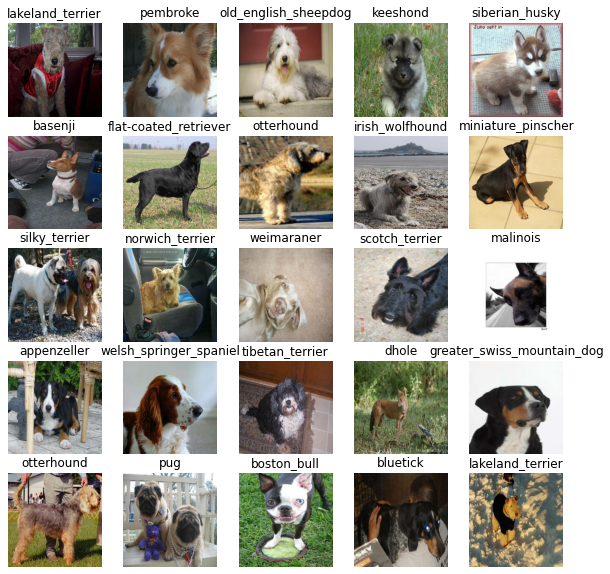

In [ ]:
# Let's visulize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

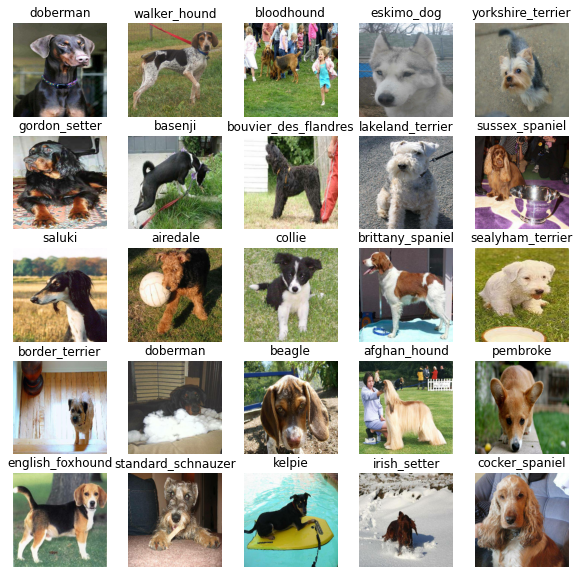

In [ ]:
# Let's visulize the data in a validation batch
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few thinds we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from [TensorFlow Hub](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4).

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #Batch size, height, weight, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds) # array in which the correct label will be true and others will be false

# setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got out inputs, output and model ready to go.
Let's put them together into a keras deep learning model!

Knowing this, let's create a function:
* Takes the input shape, output shape and the model
* Defines the layers in a Keras model in sequential fashion (first this, then this, then that)
* Complies the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

Setting up the model layers

There are two ways to do this in Keras, the [functional](https://www.tensorflow.org/guide/keras/functional) and [sequential](https://www.tensorflow.org/guide/keras/overview#build_a_simple_model) API.

In [ ]:
# Create a function which builds a Keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Model Building Initiated with model", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Input Layer
                               tf.keras.layers.Dense(units = OUTPUT_SHAPE, 
                                                     activation = 'softmax') # Output layer
  ])

  # compile the model 
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary() # this is tf.keras.sequential's internal function

Model Building Initiated with model https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


223 MobileNetV2-the-model-were-using-architecture-explanation-by-Sik-Ho-Tsang
https://towardsdatascience.com/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c  

223 Step-by-step-breakdown-of-a-convolutional-neural-network-what-MobileNetV2-is-made-of-
https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53  


224 -Article-How-to-choose-loss-activation-functions-when-building-a-deep-learning-model
https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/

## Creating Callbacks
 
Callbacks are helper function a model can use during training to do such things as save it's progress, check a model stops imporving.

We'll create two callbacks, one for TensorBoard which helps track out models progress and another for early model from trining for too long.

## TensorBoard Callback

to setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to do a directory and pass it to our model's `fit()` function
3. Visulize our models training logs with the `%tensorboard` magic function (we'll do this model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# create a function to build a TensorBoard callback (save logs)
def create_tensorboard_callback():
  # Create a log diretory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/My Drive/Dog Breed Kaggle/Logs", 
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stoping Callback

Early stopping help stops out model form overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", 
                                                  patience = 3)

## Training a model (on subset of data)

Our first model is only going to trian on 1000 images, to make sure everything is working.

In [ ]:
 NUM_EPOCHS = 100 #@param {type:"slider", min :10, step :10, max : 100}

In [ ]:
# check the GPU availabily again
print("GPU", "avalilable" if tf.config.list_physical_devices("GPU") else "not available")

GPU avalilable


#### Let's create a finction which trains a model.

* create a model using `create_model()`
* Setup a TensoreBoard and the callbacks using `create_tensorboard_callback()`
* Call `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd lile to use
* Return the model

In [ ]:
# Build a functio to trai and return a trained model 
def train_model():
  """
  Trains a given a model and returns the trained version 
  """ 

  # create a model 
  model = create_model()

  # create new TensorBoard session everytime we train a model 
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Returns the model
  return model 

In [ ]:
#  %%time

# # This model takes around 8 mins to train and already saved, so this cell is commented
# # Fit the model to the data
# model = train_model()

Model Building Initiated with model https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 6.0285 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 360s 14s/step - loss: 4.6259 - accuracy: 0.1075 - val_loss: 3.4613 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 4s 172ms/step - loss: 1.6555 - accuracy: 0.6850 - val_loss: 2.1858 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 171ms/step - loss: 0.5735 - accuracy: 0.9237 - val_loss: 1.6614 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 4s 173ms/step - loss: 0.2594 - accuracy: 0.9850 - val_loss: 1.4606 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 177ms/step - loss: 0.1496 - accuracy: 0.9987 - val_loss: 1.3959 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 179ms/step - loss: 0.1014 - accuracy: 1.0000 - val_loss: 1.3443 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================] - 4s 179ms/step - loss: 0.0757 - accuracy: 1.0000 - val_loss: 1.3169 - val_accuracy: 0.6450
Epoch 8/100

**Question**
  
It looks like our model is overfitting because it's preforming far better on the training dataset than validation dataset
What are some ways to prevent model overfitting in deep learnning neural networks?

**Note :** In a way overfitting is a good thing, this means our model is learning.

### Checking the TensorBoard logs

The TensorBoard(`%tensorborad`) will access the logs directory we created earlier and visulize the contents.

In [ ]:
%tensorboard --logdir "/content/drive/My Drive/Dog Breed Kaggle/Logs"

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 109ms/step


array([[8.0973911e-04, 1.7140615e-05, 2.8589388e-04, ..., 4.4402111e-04,
        1.2492072e-05, 3.0127715e-02],
       [4.2225872e-03, 2.1018151e-03, 4.6541574e-03, ..., 7.3703361e-04,
        5.1841144e-03, 2.6663987e-04],
       [8.5333495e-06, 6.9169168e-05, 1.3039041e-04, ..., 8.6166438e-05,
        1.5365731e-05, 1.2776909e-04],
       ...,
       [3.3878084e-06, 4.0945542e-05, 1.1688364e-04, ..., 3.3268734e-06,
        3.6380923e-05, 1.8061946e-05],
       [6.2759379e-03, 4.5000241e-04, 5.0467592e-05, ..., 3.3018354e-04,
        4.1887371e-05, 1.4435954e-02],
       [4.9146493e-05, 4.5211280e-05, 3.4560927e-03, ..., 5.9121274e-03,
        2.5181463e-03, 9.0457710e-05]], dtype=float32)

In [ ]:
predictions[0] # this gives the probiblity of first sample for each dog breed 

array([8.09739111e-04, 1.71406155e-05, 2.85893882e-04, 1.00366320e-04,
       1.49104135e-05, 8.36389609e-06, 1.74955819e-02, 8.19416891e-04,
       1.03678969e-04, 1.58136041e-04, 8.16756510e-05, 1.52398658e-04,
       1.36225746e-04, 3.65429732e-05, 9.04638728e-05, 7.17283809e-04,
       1.85059598e-05, 1.23978682e-01, 5.61321722e-05, 1.26219784e-05,
       9.58489691e-05, 6.09946146e-05, 7.07324898e-06, 3.74686380e-04,
       1.02186468e-05, 9.20794904e-04, 5.66078365e-01, 3.74488300e-05,
       9.39510865e-05, 2.14618965e-04, 6.84793995e-05, 7.54693639e-04,
       4.86322126e-04, 2.26153879e-05, 1.33283975e-04, 9.80024692e-03,
       4.49145818e-06, 4.35267080e-04, 2.57584761e-04, 9.57593511e-05,
       2.64004222e-04, 2.13639469e-05, 7.15773203e-04, 6.07746697e-05,
       5.09048623e-05, 2.30062324e-05, 3.80468337e-05, 1.61702206e-04,
       2.44107505e-04, 2.13847903e-04, 2.64510629e-04, 5.15339489e-05,
       7.23400517e-05, 8.38283377e-05, 1.57251314e-04, 3.94206145e-05,
      

In [ ]:
len(predictions[0]), sum(predictions[0])

(120, 0.9999999918873073)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First Predictions
index = 0
print(predictions[index])
print("\n\n")
print(f"Max value (probability of predictions) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max Index : {np.argmax(predictions[index])}")
print(f"Predicted Label : {unique_breeds[np.argmax(predictions[index])]}")

[8.09739111e-04 1.71406155e-05 2.85893882e-04 1.00366320e-04
 1.49104135e-05 8.36389609e-06 1.74955819e-02 8.19416891e-04
 1.03678969e-04 1.58136041e-04 8.16756510e-05 1.52398658e-04
 1.36225746e-04 3.65429732e-05 9.04638728e-05 7.17283809e-04
 1.85059598e-05 1.23978682e-01 5.61321722e-05 1.26219784e-05
 9.58489691e-05 6.09946146e-05 7.07324898e-06 3.74686380e-04
 1.02186468e-05 9.20794904e-04 5.66078365e-01 3.74488300e-05
 9.39510865e-05 2.14618965e-04 6.84793995e-05 7.54693639e-04
 4.86322126e-04 2.26153879e-05 1.33283975e-04 9.80024692e-03
 4.49145818e-06 4.35267080e-04 2.57584761e-04 9.57593511e-05
 2.64004222e-04 2.13639469e-05 7.15773203e-04 6.07746697e-05
 5.09048623e-05 2.30062324e-05 3.80468337e-05 1.61702206e-04
 2.44107505e-04 2.13847903e-04 2.64510629e-04 5.15339489e-05
 7.23400517e-05 8.38283377e-05 1.57251314e-04 3.94206145e-05
 1.27671025e-04 4.37575771e-04 1.80056697e-04 2.17890814e-02
 4.17847587e-05 3.56059536e-05 7.70613784e-04 9.76409046e-06
 2.82883178e-04 1.162786

Having the above functionality is great but we want to be able sacle it.  
And it would be even better if we could see the image the prediction is being made on!  
**Note** - Prediction probabilites are also known as confidence interval

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilites into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on a array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (images, label)
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Run the above function
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:
* Prediction Label
* Validation Label (with truth, the true labels)
* Validation Images

Let's make some function to make thse all a bit more visual. This function will

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. 
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  """
  View the prediction, ground truth and images for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  # Change the color of the title depending on it the prediction is right or worong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
    
  # Change plot title to be predicted, probabilities of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, 
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)
  

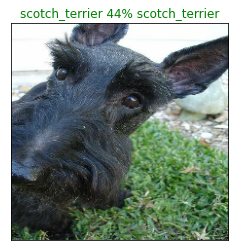

In [ ]:
 plot_pred(predictions, val_labels, val_images)



Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  *  Prediction probabilities indexes
  *  Prediction probabilities values
  *  Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  
  """
  Plus the top 10 highest prediction confidence along with the truth label for example n.
  """
  
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[:-11:-1] # Returns the indices that would sort the array, then top 10 

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup the plot
  top_plot = plt.bar(top_10_pred_labels,
                    top_10_pred_values,
                    color = "grey")
  plt.xticks(rotation = "vertical")


  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

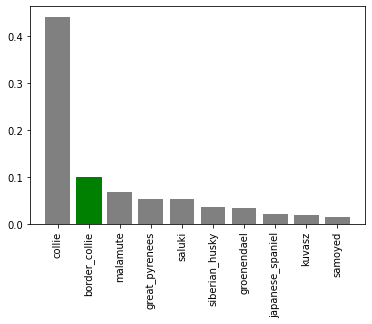

In [ ]:
plot_pred_conf(predictions, val_labels, n = 9)

Now we've got some functions to help us visuvalize our predictions and evalute our model, let's check out a few

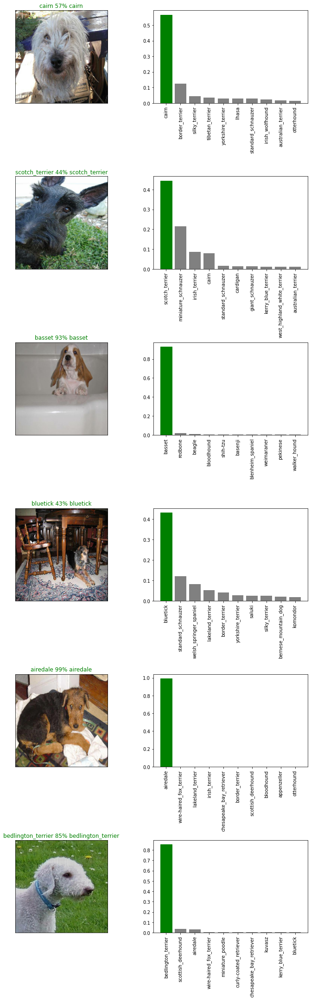

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 6
num_cols = 1
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, n = i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n = i+i_multiplier)

plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Save a given model in a models directory and appends a suffix (string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/My Drive/Dog Breed Kaggle/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix + ".h5" # Save format of model
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# create a function to reload a saved model

def load_model(model_path):
  """
  Loads a  saved model form a specified path.
  """

  print(f"Loading saved model from : {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer" : hub.KerasLayer})
  return model

Now we've got the functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-modelnetv2-Adam") #to understand the specfications of the model trained 

Saving model to:/content/drive/My Drive/Dog Breed Kaggle/Models/20201101-03501604202619_1000-imahes-modelnetv2-Adam.h5...


'/content/drive/My Drive/Dog Breed Kaggle/Models/20201101-03501604202619_1000-imahes-modelnetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/My Drive/Dog Breed Kaggle/Models/20201101-03501604202619_1000-imahes-modelnetv2-Adam.h5')

Loading saved model from : /content/drive/My Drive/Dog Breed Kaggle/Models/20201101-03501604202619_1000-imahes-modelnetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 95ms/step - loss: 1.2623 - accuracy: 0.6400


[1.2622889280319214, 0.6399999856948853]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 91ms/step - loss: 1.2623 - accuracy: 0.6400


[1.2622889280319214, 0.6399999856948853]

## Training our model with full data

In [ ]:
# Create a data batch will full data set
full_data = create_data_batches(X, y)

Creating training data batches..


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Model Building Initiated with model https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

#No Validatoin set when training on all the data so we can't monitor accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

**Note** - Running the cell below will take a little while because the GPU will load all the images into the memory for the first epoch.

Total time taken - Wall time: 1h 19min 53s

In [ ]:
%%time
# Fit the full model to the full data
# full_model.fit(x = full_data,
#                epochs = NUM_EPOCHS,
#                callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 4116s 13s/step - loss: 1.3229 - accuracy: 0.6728
Epoch 2/100
320/320 [==============================] - 41s 128ms/step - loss: 0.3948 - accuracy: 0.8850
Epoch 3/100
320/320 [==============================] - 41s 127ms/step - loss: 0.2382 - accuracy: 0.9339
Epoch 4/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1538 - accuracy: 0.9617
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1044 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0760 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 41s 130ms/step - loss: 0.0591 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0467 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0367 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 41s 128m

In [ ]:
# Save the fully trained model
save_model(model, suffix = "full-images-modelnetv2-Adam") #to understand the specfications of the model trained 

Saving model to:/content/drive/My Drive/Dog Breed Kaggle/Models/20201101-06211604211667_full-images-modelnetv2-Adam.h5...


'/content/drive/My Drive/Dog Breed Kaggle/Models/20201101-06211604211667_full-images-modelnetv2-Adam.h5'

In [ ]:
# Loading the full model
loaded_full_model = load_model('/content/drive/My Drive/Dog Breed Kaggle/Models/20201101-06211604211667_full-images-modelnetv2-Adam.h5')

Loading saved model from : /content/drive/My Drive/Dog Breed Kaggle/Models/20201101-06211604211667_full-images-modelnetv2-Adam.h5


## Making predictions for the Test Dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

We've created `crete_data_batched()` earlier which can take a list of filenames and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test images filenames.
* Convert the filenames into test data and batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/My Drive/Dog Breed Kaggle/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/My Drive/Dog Breed Kaggle/test/eec15026b5af233fa79dfb6081e1f339.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/f1eadf24d904d3c1e26d8081555901be.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/f367afa19bb30234fafa16c64b3730f0.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/e995cbf5f2c4da27a1e56966c70de380.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/ed4535d3e501ff280dfefb927b0e093a.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/f4eb6450497df847ef1012d61d869007.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/ea1039f3869357b53abf4ace351218a6.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/f4560b7a3045615d9fcc915b5b08de1b.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/ef8f1d898040c1fe2972ebe945184056.jpg',
 '/content/drive/My Drive/Dog Breed Kaggle/test/f53aa47b4676b1f135ac2eeeee01db9b.jpg']

In [ ]:
# Convert them into batches 
test_data = create_data_batches(test_filenames, test_data = True)
test_data

Creating test data batches..


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note** -  Calling `predict()` on our full model for 10k images will take a long time.

Total time taken - Wall time: 1h 24min 37s

In [ ]:
# %%time
# # Make predictions on test data on the full blown loaded model
# test_predictions = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 5062s 16s/step
CPU times: user 53.1 s, sys: 18.3 s, total: 1min 11s
Wall time: 1h 24min 37s


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/My Drive/Dog Breed Kaggle/preds_array.csv", test_predictions, delimiter = ",")

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed.  
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation



In [ ]:
# Load predictions (numpy array) from our csv file in the drive and assign the headers as breed names
test_predictions = pd.read_csv("/content/drive/My Drive/Dog Breed Kaggle/preds_array.csv", 
                               header = None, 
                               names=list(unique_breeds)) 
test_predictions.head()

,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,english_foxhound,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,0.000664,0.000130,0.000736,0.000061,0.000030,0.074574,0.003008,0.008746,0.000039,0.001399,0.000160,0.000986,0.005235,0.000243,0.000568,0.000661,0.000237,0.000029,0.000165,0.001194,0.000061,0.000059,0.005436,0.000180,0.000264,0.000577,0.000172,0.022051,0.000683,0.009191,0.002364,0.000010,0.000024,0.000022,0.000081,0.000033,0.002812,0.004034,0.004311,0.000347,...,0.003189,0.000708,0.000171,0.000049,0.000127,0.000041,0.035306,0.000274,0.000203,0.006777,0.000267,0.000436,0.000052,0.000378,0.002010,0.058323,0.004146,0.000181,0.000016,0.000695,0.000364,0.003329,0.000456,0.000066,0.000157,0.000078,0.000105,0.000039,0.005710,0.000022,0.001026,0.028292,0.000431,0.000154,0.000061,0.000020,0.000574,0.000008,0.000061,0.000284
1,0.000050,0.000167,0.001921,0.000051,0.000081,0.000426,0.000131,0.000159,0.000072,0.000179,0.000107,0.000161,0.000650,0.000068,0.000452,0.000224,0.000204,0.000081,0.000554,0.001615,0.000044,0.000227,0.000044,0.000233,0.000301,0.000174,0.000258,0.000126,0.000021,0.000463,0.000507,0.000012,0.000051,0.000579,0.000385,0.000070,0.000772,0.000173,0.000042,0.000199,...,0.000254,0.000057,0.000220,0.000160,0.000296,0.000422,0.000354,0.000064,0.000108,0.000224,0.000059,0.000220,0.000465,0.000581,0.001234,0.000730,0.000241,0.001308,0.000105,0.000281,0.000055,0.710554,0.000153,0.000076,0.000034,0.000306,0.000328,0.000332,0.000192,0.000028,0.000153,0.000234,0.000147,0.000032,0.000114,0.000034,0.000412,0.000115,0.004730,0.000245
2,0.000773,0.000127,0.000222,0.000024,0.008074,0.000054,0.000025,0.000803,0.000312,0.000841,0.001221,0.000017,0.019465,0.000020,0.000139,0.003092,0.000060,0.000484,0.000089,0.000177,0.000069,0.000712,0.000255,0.000129,0.055673,0.001054,0.000025,0.000583,0.119539,0.000385,0.000146,0.000201,0.000027,0.000015,0.000936,0.000005,0.000024,0.000018,0.000676,0.001643,...,0.000192,0.000158,0.000104,0.000079,0.000054,0.000132,0.000132,0.000046,0.000335,0.001189,0.001007,0.000705,0.000157,0.000098,0.000062,0.001492,0.000034,0.000931,0.000557,0.000236,0.001698,0.004241,0.000110,0.000097,0.000194,0.000055,0.000161,0.000255,0.000305,0.000212,0.001408,0.024540,0.006893,0.006616,0.032904,0.000127,0.000381,0.000653,0.000584,0.000011
3,0.002898,0.000081,0.000025,0.000028,0.000957,0.000212,0.001980,0.000786,0.000073,0.000401,0.001786,0.004347,0.000340,0.007982,0.000095,0.000085,0.000841,0.000084,0.001495,0.004229,0.000272,0.000842,0.000287,0.000419,0.340294,0.000085,0.000006,0.114953,0.004265,0.004439,0.000503,0.000792,0.000602,0.011356,0.000522,0.001372,0.000229,0.000065,0.000170,0.000974,...,0.000698,0.000981,0.000321,0.002436,0.004368,0.002785,0.001149,0.001386,0.001557,0.000009,0.000014,0.002257,0.000294,0.000497,0.001473,0.002246,0.000110,0.000201,0.000095,0.012040,0.085314,0.028794,0.000006,0.000042,0.000029,0.000266,0.000847,0.019999,0.000765,0.002568,0.000287,0.074651,0.000695,0.001578,0.000634,0.079380,0.000030,

In [ ]:
# we still need to add the image id
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)] # extracting id's from the files present in the required folder
test_predictions.insert(0, "id", test_ids) # adding the id's to 0th index
test_predictions.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eec15026b5af233fa79dfb6081e1f339,0.000664,0.000130,0.000736,0.000061,0.000030,0.074574,0.003008,0.008746,0.000039,0.001399,0.000160,0.000986,0.005235,0.000243,0.000568,0.000661,0.000237,0.000029,0.000165,0.001194,0.000061,0.000059,0.005436,0.000180,0.000264,0.000577,0.000172,0.022051,0.000683,0.009191,0.002364,0.000010,0.000024,0.000022,0.000081,0.000033,0.002812,0.004034,0.004311,...,0.003189,0.000708,0.000171,0.000049,0.000127,0.000041,0.035306,0.000274,0.000203,0.006777,0.000267,0.000436,0.000052,0.000378,0.002010,0.058323,0.004146,0.000181,0.000016,0.000695,0.000364,0.003329,0.000456,0.000066,0.000157,0.000078,0.000105,0.000039,0.005710,0.000022,0.001026,0.028292,0.000431,0.000154,0.000061,0.000020,0.000574,0.000008,0.000061,0.000284
1,f1eadf24d904d3c1e26d8081555901be,0.000050,0.000167,0.001921,0.000051,0.000081,0.000426,0.000131,0.000159,0.000072,0.000179,0.000107,0.000161,0.000650,0.000068,0.000452,0.000224,0.000204,0.000081,0.000554,0.001615,0.000044,0.000227,0.000044,0.000233,0.000301,0.000174,0.000258,0.000126,0.000021,0.000463,0.000507,0.000012,0.000051,0.000579,0.000385,0.000070,0.000772,0.000173,0.000042,...,0.000254,0.000057,0.000220,0.000160,0.000296,0.000422,0.000354,0.000064,0.000108,0.000224,0.000059,0.000220,0.000465,0.000581,0.001234,0.000730,0.000241,0.001308,0.000105,0.000281,0.000055,0.710554,0.000153,0.000076,0.000034,0.000306,0.000328,0.000332,0.000192,0.000028,0.000153,0.000234,0.000147,0.000032,0.000114,0.000034,0.000412,0.000115,0.004730,0.000245
2,f367afa19bb30234fafa16c64b3730f0,0.000773,0.000127,0.000222,0.000024,0.008074,0.000054,0.000025,0.000803,0.000312,0.000841,0.001221,0.000017,0.019465,0.000020,0.000139,0.003092,0.000060,0.000484,0.000089,0.000177,0.000069,0.000712,0.000255,0.000129,0.055673,0.001054,0.000025,0.000583,0.119539,0.000385,0.000146,0.000201,0.000027,0.000015,0.000936,0.000005,0.000024,0.000018,0.000676,...,0.000192,0.000158,0.000104,0.000079,0.000054,0.000132,0.000132,0.000046,0.000335,0.001189,0.001007,0.000705,0.000157,0.000098,0.000062,0.001492,0.000034,0.000931,0.000557,0.000236,0.001698,0.004241,0.000110,0.000097,0.000194,0.000055,0.000161,0.000255,0.000305,0.000212,0.001408,0.024540,0.006893,0.006616,0.032904,0.000127,0.000381,0.000653,0.000584,0.000011
3,e995cbf5f2c4da27a1e56966c70de380,0.002898,0.000081,0.000025,0.000028,0.000957,0.000212,0.001980,0.000786,0.000073,0.000401,0.001786,0.004347,0.000340,0.007982,0.000095,0.000085,0.000841,0.000084,0.001495,0.004229,0.000272,0.000842,0.000287,0.000419,0.340294,0.000085,0.000006,0.114953,0.004265,0.004439,0.000503,0.000792,0.000602,0.011356,0.000522,0.001372,0.000229,0.000065,0.000170,...,0.000698,0.000981,0.000321,0.002436,0.004368,0.002785,0.001149,0.001386,0.001557,0.000009,0.000014,0.002257,0.000294,0.000497,0.001473,0.002246,0.000110,0.000201,0.000095,0.012040,0.085314,0.028794,0.000006,0.000042,0.000029,0.000266,0.000847,0.019999

In [ ]:
#Exporting the file
test_predictions.to_csv("/content/drive/My Drive/Dog Breed Kaggle/full_model_predictions_mobilenetV2.csv", index = False)